In [99]:
%matplotlib inline
%load_ext memory_profiler

import os, sys, glob, re, math, pickle 
import phate,scprep,magic,meld
import graphtools as gt
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy import stats
import time,random,datetime
from scipy import sparse
from scipy.stats import mannwhitneyu, tiecorrect, rankdata
from statsmodels.stats.multitest import multipletests
import scanpy as sc
from sklearn.model_selection import train_test_split


# settings
plt.rc('font', size = 9)
plt.rc('font', family='sans serif') 
plt.rcParams['pdf.fonttype']=42
plt.rcParams['ps.fonttype']=42
plt.rcParams['text.usetex']=True
plt.rcParams['legend.frameon']=False
plt.rcParams['axes.grid']=False
plt.rcParams['legend.markerscale']=0.5
sc.set_figure_params(dpi=300,dpi_save=600,
                     frameon=False,
                     fontsize=9)
plt.rcParams['savefig.dpi'] = 600
sc.settings.verbosity=2

# reproducibility
rs = np.random.seed(42)

The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


In [187]:
# fps
dfp = '/home/ngr4/project/scnd/data/'
pfp = '/home/ngr4/project/scnd/results/'
pdfp = '/home/ngr4/project/scnd/data/processed/'
sc.settings.figdir = pfp
    
if True :
    # load data objects
    start = time.time()
    backed=None # None if not
    fname='humanpm.h5ad' # for full, can maybe get away with ~300G
    %memit adata = sc.read_h5ad(os.path.join(pdfp,fname),backed=backed)
    print('loaded @'+datetime.datetime.now().strftime('%y%m%d.%H:%M:%S'))
    print('took {:.2f}-s to load data'.format(time.time()-start))
    
if False :
    # export for seurat load to run LIGER & SEURAT 3 batch crct
    scanpy2seurat=sc.AnnData(adata.X.todense(),raw=adata.raw,obs=adata.obs)
    if True :
        start = time.time()
        scanpy2seurat.write(os.path.join(pdfp,'scanpy2seurat_human.h5ad'))
        print('saved @'+datetime.datetime.now().strftime('%y%m%d.%H:%M:%S'))
        print('took {:.2f}-s to save data'.format(time.time()-start))
        del scanpy2seurat
        
if False :
    start = time.time()
    sintegrated = pd.read_csv(os.path.join(pdfp,'seurat_integrated.csv'))
    sintegrated = sintegrated.T
    sintegrated.index = [i.replace('.','-') for i in sintegrated.index]
    sintegrated = sintegrated.reindex(adata.obs.index)
    # new adata object
    sidata = sc.AnnData(sintegrated,obs=adata.obs)
    sidata.X = (sidata.X - sidata.X.mean(axis=0))/sidata.X.std(axis=0) # scale and center data, as in Seurat
    del sintegrated
    print('saved @'+datetime.datetime.now().strftime('%y%m%d.%H:%M:%S'))
    print('took {:.2f}-s to load data'.format(time.time()-start))
    
if True :
    start = time.time()
    sct = pd.read_csv(os.path.join(pdfp,'sctransform_integrated_all_bigmem.csv'))
    sct.index = sct['rn']
    sct = sct.T
#     sct.index = [i.replace('.','-') for i in sct.index]
    sct = sct.reindex(adata.obs.index)
    # new adata object
    sctdata = sc.AnnData(sct,obs=adata.obs) # do not scale & center scTransform data
    del sct
    print('loaded @'+datetime.datetime.now().strftime('%y%m%d.%H:%M:%S'))
    print('took {:.2f}-s to load data'.format(time.time()-start))
    
if False :
    start = time.time()
    l = pd.read_csv(os.path.join(pdfp,'liger_integrated.csv'))
    l.index = l['rn']
    l = l.drop(columns=['rn']+[i for i in test.columns.to_list() if i.startswith('MT-')])
#     l = l[[adata.var_names]] # may not be necessary AND does not work 
    l = l.reindex(adata.obs.index)
    # new adata object
    ldata = sc.AnnData(l,obs=adata.obs) # do not scale & center scTransform data
    del l
    print('saved @'+datetime.datetime.now().strftime('%y%m%d.%H:%M:%S'))
    print('took {:.2f}-s to load data'.format(time.time()-start))
    
if False :
    start = time.time()
    l = pd.read_csv(os.path.join(pdfp,'liger_Hnorm.csv'))
    l.index = l['rn']
    l = l.drop(columns=['rn'])
#     l = l.drop(columns=['rn']+[i for i in test.columns.to_list() if i.startswith('MT-')])
#     l = l[[adata.var_names]] # may not be necessary AND does not work 
    l = l.reindex(adata.obs.index)
    # new adata object
    ldata = sc.AnnData(l,obs=adata.obs) # do not scale & center scTransform data
    del l
    print('saved @'+datetime.datetime.now().strftime('%y%m%d.%H:%M:%S'))
    print('took {:.2f}-s to load data'.format(time.time()-start))



peak memory: 61590.12 MiB, increment: 17436.77 MiB
loaded @200312.17:22:49
took 124.75-s to load data
loaded @200312.17:48:29
took 1540.09-s to load data


In [4]:
adata=sc.read_10x('/gpfs/ycga/sequencers/pacbio/gw92/10x/data_sent/llt26/121819/7202_MNT_cellranger/filtered_feature_bc_matrix/')


NameError: name 'sc' is not defined

In [36]:
# aesthetics
pal18=['#ee5264','#565656','#75a3b7','#ffe79e','#fac18a','#f1815f','#ac5861','#62354f','#2d284b','#f4b9b9','#c4bbaf',
       '#f9ebae','#aecef9','#aeb7f9','#f9aeae','#9c9583','#88bb92','#bde4a7','#d6e5e3']
# random.shuffle(pal18)
# cmap_louvain = {v:pal18[i] for i,v in enumerate(np.unique(adata.obs.louvain.astype(int).to_numpy()))}
pal25 = sns.cubehelix_palette(25)
# cmap_louvain = {v:pal18[i] for i,v in enumerate(np.unique(sidata.obs.louvain.astype(int).to_numpy()))}
# pal_ctype=sns.color_palette('colorblind',len(adata.obs['Cell type'].unique()))
# cmap_ctype={v:pal18[i] for i,v in enumerate(adata.obs['Cell type'].unique())}
cmap_ctype={'Bergmann glia': '#f4b9b9',
 'Granule cells': '#bde4a7',
 'Astrocytes (II)': '#d6e5e3',
 'Astrocytes (I)': '#aeb7f9',
 'Unidentified': '#2d284b',
 'Unipolar brush cells': '#aecef9',
 'Inhibitory neuron (I)': '#9c9583',
 'Microglia': '#88bb92',
 'Excitatory neurons': '#ac5861',
 'Oligodendrocytes (I)': '#ffe79e',
 'Inhibitory neuron (III)': '#f9aeae',
 'Inhibitory neuron (II)': '#ee5264',
 'Oligodendrocytes (II)': '#f1815f',
 'Pericytes': '#75a3b7',
 'Vascular cells': '#ace5ee',
 'Purkinje cells': '#62354f',
 'OPC': '#fac18a',
 'Choroid plexus epithelial cells': '#c4bbaf'}

# pal_genotype=sns.color_palette('colorblind',len(adata.obs['genotype'].unique()))
# cmap_genotype={v:pal_genotype[i] for i,v in enumerate(adata.obs['genotype'].unique())}
cmap_genotype={'WT':'#010101',
               'SCA1':'#ffd478'}

pal5=['#f9aeae','#9c9583','#88bb92','#fac18a','#75a3b7']
random.shuffle(pal5)

sequential5 = sns.cubehelix_palette(5,start=.5,rot=-.75)

if False :
    pal_timepoint=sns.color_palette('colorblind',len(adata.obs['timepoint'].unique()))
    cmap_timepoint={v:sequential5[i] for i,v in enumerate(adata.obs['timepoint'].unique())}
    
cmap_sample = {v:pal18[i] for i,v in enumerate(adata.obs['Sample'].unique())}


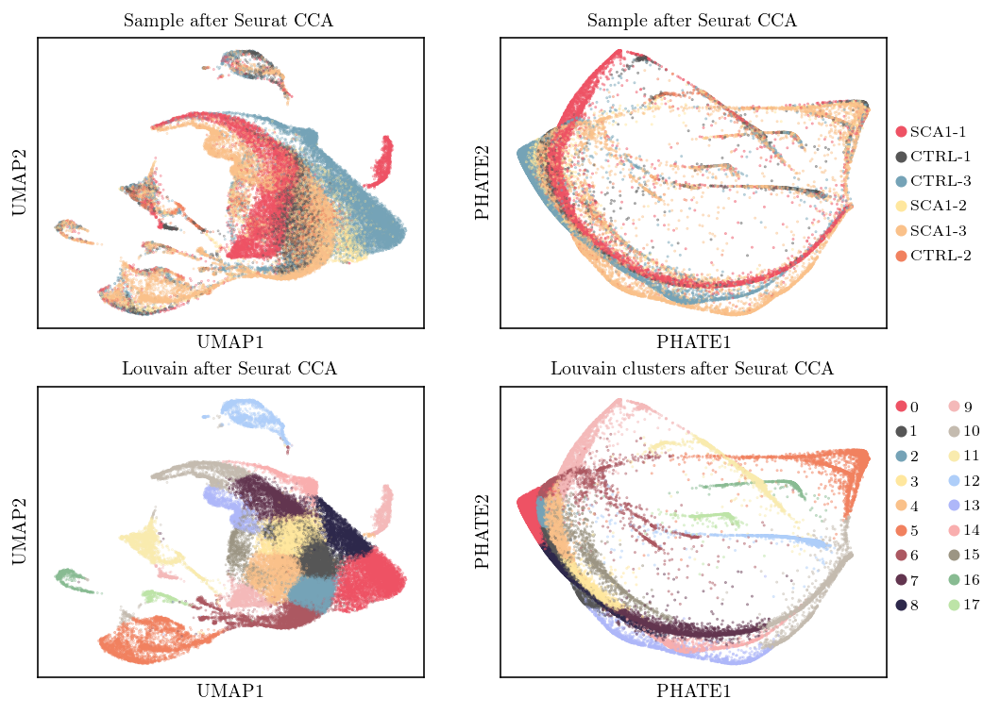

In [13]:
if False :
    # Seurat CCA
    sc.tl.pca(sidata, n_comps=100)
    sc.pp.neighbors(sidata, n_neighbors=100, n_pcs=100)
    sc.tl.louvain(sidata)
    sc.tl.umap(sidata)
    sidata.obsm['X_phate']=phate.PHATE(knn=100,n_components=100).fit_transform(sidata.X)

    pal25 = sns.cubehelix_palette(25)
    cmap_louvain = {v:pal18[i] for i,v in enumerate(np.unique(sidata.obs.louvain.astype(int).to_numpy()))}

    fig,ax=plt.subplots(2,2,figsize=(8,6))
    scprep.plot.scatter2d(sidata.obsm['X_umap'],
                          c=sidata.obs['Sample'],
                          cmap=cmap_sample,
                          ticks=None,
                          label_prefix='UMAP',
                          legend=False,
                          ax=ax[0,0],
                          s = 0.1,
                          alpha=0.6,
                          rasterized=True,
                          title='Sample after Seurat CCA')
    scprep.plot.scatter2d(sidata.obsm['X_phate'],
                          c=sidata.obs['Sample'],
                          cmap=cmap_sample,
                          ticks=None,
                          label_prefix='PHATE',
                          legend=True,
                          legend_loc=(1.01,0.2),
                          ax=ax[0,1],
                          s = 0.2,
                          alpha=0.6,
                          rasterized=True,
                          title='Sample after Seurat CCA')
    scprep.plot.scatter2d(sidata.obsm['X_umap'],
                          c=sidata.obs['louvain'].astype(int).to_numpy(),
                          cmap=cmap_louvain,
                          ticks=None,
                          label_prefix='UMAP',
                          legend=False,
                          ax=ax[1,0],
                          s = 0.1,
                          alpha=0.6,
                          rasterized=True,
                          title='Louvain after Seurat CCA')
    scprep.plot.scatter2d(sidata.obsm['X_phate'],
                          c=sidata.obs['louvain'].astype(int).to_numpy(),
                          cmap=cmap_louvain,
                          ticks=None,
                          label_prefix='PHATE',
                          legend=True,
                          legend_loc=(1.01,0.2),
                          ax=ax[1,1],
                          s = 0.2,
                          alpha=0.6,
                          rasterized=True,
                          title='Louvain clusters after Seurat CCA')
    fig.savefig(os.path.join(pfp,'batch_seuratCCA.pdf'),dpi=300, bbox_inches='tight')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:22)


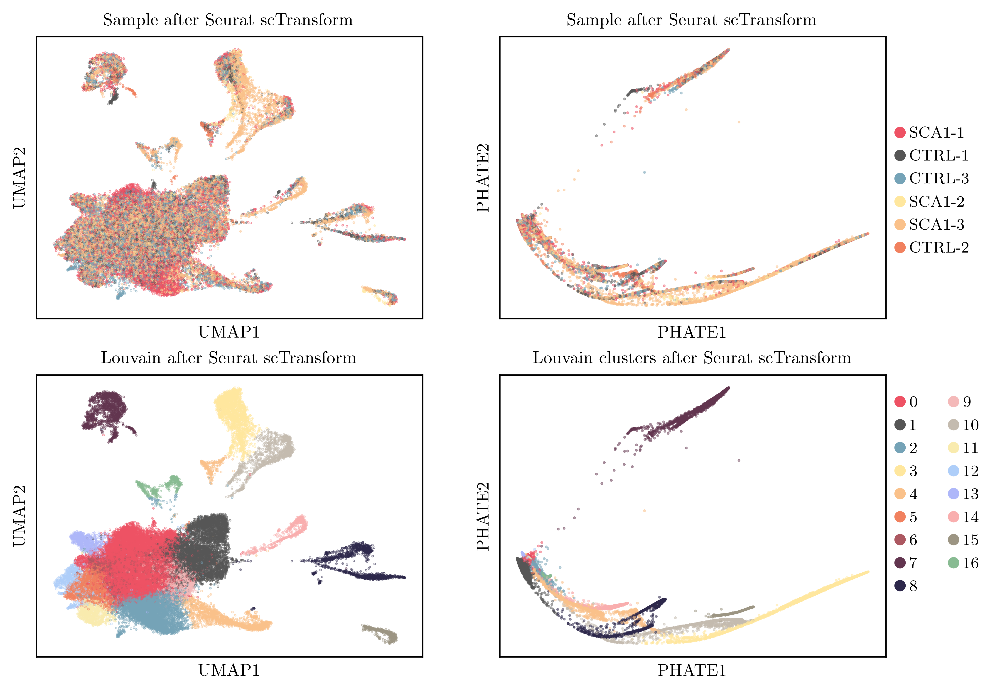

In [191]:
if True :
    # Seurat scTransform
#     sc.tl.pca(sctdata, n_comps=100)
#     sc.pp.neighbors(sctdata, n_neighbors=100, n_pcs=100)
    sc.tl.louvain(sctdata,resolution=0.6)
#     sc.tl.umap(sctdata)
#     sctdata.obsm['X_phate']=phate.PHATE(knn=100,n_components=100).fit_transform(sctdata.X)

    pal27 = pal18 + sns.cubehelix_palette(3) + sns.cubehelix_palette(3,rot=-.4) + sns.cubehelix_palette(3,start=2.8, rot=.1)
    cmap_louvain = {v:pal27[i] for i,v in enumerate(np.unique(sctdata.obs.louvain.astype(int).to_numpy()))}

    fig,ax=plt.subplots(2,2,figsize=(8,6))
    scprep.plot.scatter2d(sctdata.obsm['X_umap'],
                          c=sctdata.obs['Sample'],
                          cmap=cmap_sample,
                          ticks=None,
                          label_prefix='UMAP',
                          legend=False,
                          ax=ax[0,0],
                          s = 0.1,
                          alpha=0.6,
                          rasterized=True,
                          title='Sample after Seurat scTransform')
    scprep.plot.scatter2d(sctdata.obsm['X_phate'],
                          c=sctdata.obs['Sample'],
                          cmap=cmap_sample,
                          ticks=None,
                          label_prefix='PHATE',
                          legend=True,
                          legend_loc=(1.01,0.2),
                          ax=ax[0,1],
                          s = 0.2,
                          alpha=0.6,
                          rasterized=True,
                          title='Sample after Seurat scTransform')
    scprep.plot.scatter2d(sctdata.obsm['X_umap'],
                          c=sctdata.obs['louvain'].astype(int).to_numpy(),
                          cmap=cmap_louvain,
                          ticks=None,
                          label_prefix='UMAP',
                          legend=False,
                          ax=ax[1,0],
                          s = 0.1,
                          alpha=0.6,
                          rasterized=True,
                          title='Louvain after Seurat scTransform')
    scprep.plot.scatter2d(sctdata.obsm['X_phate'],
                          c=sctdata.obs['louvain'].astype(int).to_numpy(),
                          cmap=cmap_louvain,
                          ticks=None,
                          label_prefix='PHATE',
                          legend=True,
                          legend_loc=(1.01,0.2),
                          ax=ax[1,1],
                          s = 0.2,
                          alpha=0.6,
                          rasterized=True,
                          title='Louvain clusters after Seurat scTransform')
    fig.savefig(os.path.join(pfp,'batch_seuratSCT.pdf'),dpi=300, bbox_inches='tight')

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 50
    finished (0:00:00)
computing neighbors
    using data matrix X directly


/gpfs/ycga/project/dijk/ngr4/conda_envs/rnavel/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../conda_envs/rnavel/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/gpfs/ycga/project/dijk/ngr4/conda_envs/rnavel/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../.

    finished (0:01:04)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:01:17)
computing UMAP
    finished (0:01:37)
Calculating PHATE...
  Running PHATE on 41150 cells and 50 genes.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 159.83 seconds.
    Calculating affinities...
    Calculated affinities in 14.15 seconds.
  Calculated graph and diffusion operator in 176.97 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 74.52 seconds.
    Calculating KMeans...
    Calculated KMeans in 29.07 seconds.
  Calculated landmark operator in 110.38 seconds.
  Calculating optimal t...
  Calculated optimal t in 1.60 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.30 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 203.00 seconds.
Calculated PHATE in 492.47 seconds.


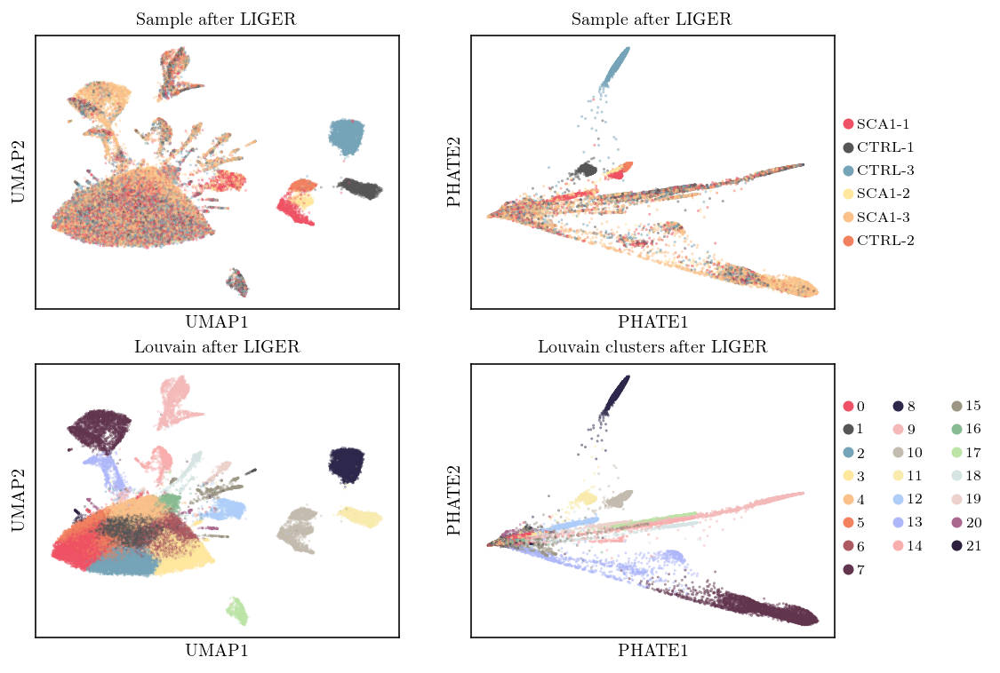

In [41]:
if False :
    # LIGER
    sc.tl.pca(ldata, n_comps=50)
    sc.pp.neighbors(ldata, n_neighbors=100, n_pcs=50)
    sc.tl.louvain(ldata)
    sc.tl.umap(ldata)
    ldata.obsm['X_phate']=phate.PHATE(knn=100,n_components=50).fit_transform(ldata.X)

    pal27 = pal18 + sns.cubehelix_palette(3) + sns.cubehelix_palette(3,rot=-.4) + sns.cubehelix_palette(3,start=2.8, rot=.1)
    cmap_louvain = {v:pal27[i] for i,v in enumerate(np.unique(ldata.obs.louvain.astype(int).to_numpy()))}

    fig,ax=plt.subplots(2,2,figsize=(8,6))
    scprep.plot.scatter2d(ldata.obsm['X_umap'],
                          c=ldata.obs['Sample'],
                          cmap=cmap_sample,
                          ticks=None,
                          label_prefix='UMAP',
                          legend=False,
                          ax=ax[0,0],
                          s = 0.1,
                          alpha=0.6,
                          rasterized=True,
                          title='Sample after LIGER')
    scprep.plot.scatter2d(ldata.obsm['X_phate'],
                          c=ldata.obs['Sample'],
                          cmap=cmap_sample,
                          ticks=None,
                          label_prefix='PHATE',
                          legend=True,
                          legend_loc=(1.01,0.2),
                          ax=ax[0,1],
                          s = 0.2,
                          alpha=0.6,
                          rasterized=True,
                          title='Sample after LIGER')
    scprep.plot.scatter2d(ldata.obsm['X_umap'],
                          c=ldata.obs['louvain'].astype(int).to_numpy(),
                          cmap=cmap_louvain,
                          ticks=None,
                          label_prefix='UMAP',
                          legend=False,
                          ax=ax[1,0],
                          s = 0.1,
                          alpha=0.6,
                          rasterized=True,
                          title='Louvain after LIGER')
    scprep.plot.scatter2d(ldata.obsm['X_phate'],
                          c=ldata.obs['louvain'].astype(int).to_numpy(),
                          cmap=cmap_louvain,
                          ticks=None,
                          label_prefix='PHATE',
                          legend=True,
                          legend_loc=(1.01,0.2),
                          ax=ax[1,1],
                          s = 0.2,
                          alpha=0.6,
                          rasterized=True,
                          title='Louvain clusters after LIGER')
    fig.savefig(os.path.join(pfp,'batch_ligerHnorm.pdf'),dpi=300, bbox_inches='tight')

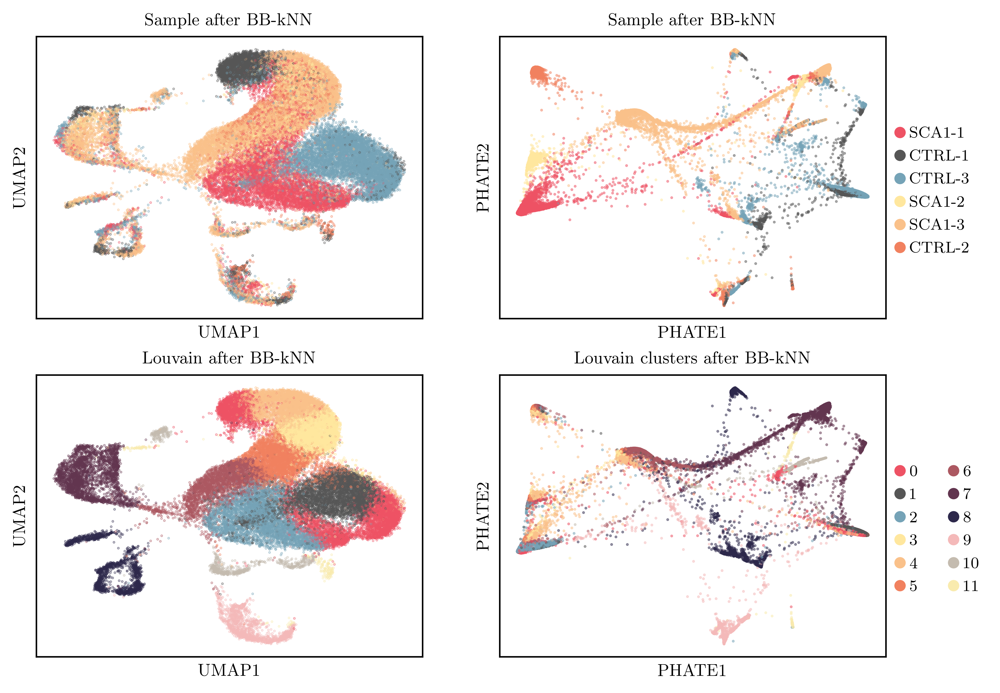

In [170]:
if True :
    # BBkNN
#     sc.tl.pca(adata, n_comps=100)
#     sc.external.pp.bbknn(adata,batch_key='Sample')
#     sc.tl.louvain(adata)
#     sc.tl.umap(adata)
#     start=time.time()
#     print('Starting graph')
#     G = gt.Graph(data=adata.uns['neighbors']['connectivities']+sparse.diags([1]*adata.shape[0],format='csr'),
#                  precomputed='adjacency',use_pygsp=True,n_jobs=-1)
#     with open(os.path.join(pdfp,'humanG100k.pkl'),'wb') as f :
#         pickle.dump(G,f,pickle.HIGHEST_PROTOCOL)
#         f.close()
#     print('... calculated in {:.2f}-s'.format(time.time()-start))
#     adata.obsm['X_phate']=phate.PHATE(knn_dist='precomputed',use_pygsp=True).fit_transform(G)
#     adata.layers['imputed']=magic.MAGIC().fit_transform(adata.X,G)

    pal27 = pal18 + sns.cubehelix_palette(3) + sns.cubehelix_palette(3,rot=-.4) + sns.cubehelix_palette(3,start=2.8, rot=.1)
    cmap_louvain = {v:pal27[i] for i,v in enumerate(np.unique(adata.obs.louvain.astype(int).to_numpy()))}
    
    fig,ax=plt.subplots(2,2,figsize=(8,6))
    scprep.plot.scatter2d(adata.obsm['X_umap'],
                          c=adata.obs['Sample'],
                          cmap=cmap_sample,
                          ticks=None,
                          label_prefix='UMAP',
                          legend=False,
                          ax=ax[0,0],
                          s = 0.1,
                          alpha=0.6,
                          rasterized=True,
                          title='Sample after BB-kNN')
    scprep.plot.scatter2d(adata.obsm['X_phate'],
                          c=adata.obs['Sample'],
                          cmap=cmap_sample,
                          ticks=None,
                          label_prefix='PHATE',
                          legend=True,
                          legend_loc=(1.01,0.2),
                          ax=ax[0,1],
                          s = 0.2,
                          alpha=0.6,
                          rasterized=True,
                          title='Sample after BB-kNN')
    scprep.plot.scatter2d(adata.obsm['X_umap'],
                          c=adata.obs['louvain'].astype(int).to_numpy(),
                          cmap=cmap_louvain,
                          ticks=None,
                          label_prefix='UMAP',
                          legend=False,
                          ax=ax[1,0],
                          s = 0.1,
                          alpha=0.6,
                          rasterized=True,
                          title='Louvain after BB-kNN')
    scprep.plot.scatter2d(adata.obsm['X_phate'],
                          c=adata.obs['louvain'].astype(int).to_numpy(),
                          cmap=cmap_louvain,
                          ticks=None,
                          label_prefix='PHATE',
                          legend=True,
                          legend_loc=(1.01,0.2),
                          ax=ax[1,1],
                          s = 0.2,
                          alpha=0.6,
                          rasterized=True,
                          title='Louvain clusters after BB-kNN')
    fig.savefig(os.path.join(pfp,'batch_bbknn.pdf'),dpi=300, bbox_inches='tight')
    
    
    

In [121]:
# test down sampling

tdata = adata[random.sample(range(adata.shape[0]),1000),:]

In [122]:
sc.external.pp.bbknn(tdata,batch_key='Sample',approx=False,n_pcs=100,metric="euclidean")

computing batch balanced neighbors
	finished (0:00:00)


Trying to set attribute `.uns` of view, making a copy.


In [167]:
adj = tdata.uns['neighbors']['connectivities']+sparse.diags([1]*tdata.shape[0],format='csr')
G = gt.Graph(data=adj,
                 precomputed='affinity',n_jobs=-1)
# G_orig = gt.Graph(data=tdata.X,use_pygsp=True,n_jobs=-1)

In [169]:
magic.MAGIC().fit_transform(tdata.X,G,genes=tdata.var_names)

Calculating MAGIC...
  Running MAGIC on 1000 cells and 27770 genes.


AttributeError: 'TraditionalGraph' object has no attribute 'knn_max'

In [194]:
markers = {'Granule cell':['Cbln3','Gabra6','Gm2694','Cbln1'],
           'Purkinje cell':['Slc1a6','Car8','Calb1','Atp2a3','Ppp1r17'],
           'OL':['Mog','Mag','Ccp110','Opalin','Hapln2','Ninj2'],
           'Stellate/Basket/Golgi':['Pvalb','Cnpy1','Tfap2b','Slc6a5','Grm2','Lgi2','Ntn1','Megf10','Cntn4'],
           'Bergmann glia':['Gdf10','Timp4','Hopx'],
           'Astrocyte':['Slc1a3','Aldh1l1','Aqp4'],
           'Microglia':['C1qb','Dock2','P2ry12','Cx3cr1','P2ry12'],
           'OPC':['Pdgfra','C1ql1','Pcdh15'],
#            'OL Lineage':['Neu4','Brca1','Gpr17','Tnr','Rinl','Cnksr3','H2-Ab1','Tmem2','Gm26834'],
#            'iOL':['Enpp6','Gjc3','Bcas1'],
#            'mOL':['Mbp','Cldn14','Mog','Mag','Hapln2'],
#            'Activated MG':['Tmem119','Casp8','Ccl4','Tnf'],
#            'Pervascular macrophage':['Pf4','Cxcl2'],
           'Pericytes':['Rgs5','Flt1','Adgrl4'],
           'Endothelial cell':['Flt1','Adgrl4','Kdr']} # Adgrl4 synonymous w/Eltd1

finalmarkers = {'Granule cell':['Gabra6','Gm2694'],
                'Excitatory neuron':['Slc17a6'],
                'Purkinje cell':['Atp2a3','Calb1','Car8','Ppp1r17','Slc1a6'],
                'Stellate/Basket/Golgi':['Megf10','Ntn1'],
                'Astrocyte':['Aldh1l1','Aqp4','Slc1a3'],
                'Bergmann glia':['Gdf10','Hopx','Timp4'],
                'OL lineage':['Olig1','Olig2'],
                'OPC':['C1ql1','Pdgfra','Ninj2'],
                'OL':['Hapln2','Mag','Mog','Opalin'],
                'Microglia':['C1qb','Cx3cr1','Dock2','P2ry12'],
                'Pericytes':['Flt1','Pdgfrb','Rgs5'],
                'Vascular':['Dcn','Lum'],
                'Choroid plexus':['Folr1','Ttr']} 
hsmarkers_sct = {'Granule cell':['Gabra6'],
#                 'Excitatory neuron':['Slc17a6'],
                'Purkinje cell':['Atp2a3','Calb1','Ca8','Slc1a6'],
                'Stellate/Basket/Golgi':['Megf10','Ntn1'],
                'Astrocyte':['Aldh1l1','Aqp4','Slc1a3'],
                'Bergmann glia':['Hopx','Timp4'],
                'OL lineage':['Olig1','Olig2'],
                'OPC':['C1ql1','Pdgfra','Ninj2'],
                'OL':['Hapln2','Mag','Mog','Opalin'],
                'Microglia':['Dock2','P2ry12'],
                'Pericytes':['Flt1','Pdgfrb','Rgs5'],
                'Vascular':['Dcn']} 

hsmarkers = {'Granule cell':['Gabra6'],
                'Excitatory neuron':['Slc17a6'],
                'Purkinje cell':['Atp2a3','Calb1','Ca8','Ppp1r17','Slc1a6'],
                'Stellate/Basket/Golgi':['Megf10','Ntn1'],
                'Astrocyte':['Aldh1l1','Aqp4','Slc1a3'],
                'Bergmann glia':['Gdf10','Hopx','Timp4'],
                'OL lineage':['Olig1','Olig2'],
                'OPC':['C1ql1','Pdgfra','Ninj2'],
                'OL':['Hapln2','Mag','Mog','Opalin'],
                'Microglia':['C1qb','Cx3cr1','Dock2','P2ry12'],
                'Pericytes':['Flt1','Pdgfrb','Rgs5'],
                'Vascular':['Dcn','Lum'],
                'Choroid plexus':['Folr1','Ttr']} 

# orig markers
old_markers = {'Granule cell':['Gabrb2','Grin2c','Il6'],
               'Purkinje cell':['Atp2a3','Pcp2','Calb1','Ryr1','Slc9a3'],
               'Stellate/Basket/Golgi':['Ntn1','Adamts2','Megf10','Rora'],
               'Bergmann glia':['Gdf10','Pla2g7','Stk32a','Emid1'],
               'Astrocyte':['Aldh1l1','Slc1a3','Aqp4'],
               'Microglia':['Cx3cr1','C1qb','Dock2','P2ry12'],
               'OPC':['Pcdh15','Epn2','Pdgfra','Myt1'],
               'iOL':['Enpp6','Gjc3','Bcas1'],
               'mOL':['Mbp','Cldn14','Mog','Mag','Hapln2'],
               'Pericytes':['Atp13a5','Rgs5','Pdgfrb'],
               'Endothelial cell':['Flt1','Adgrl4','Kdr']} # Adgrl4 synonymous w/Eltd1

humanmarkers = {}
for k,v in hsmarkers.items() : 
    newlist = []
    for g in v :
        newlist.append(g.upper())
    humanmarkers[k] = newlist
    
humanmarkers_sct = {}
for k,v in hsmarkers_sct.items() : 
    newlist = []
    for g in v :
        newlist.append(g.upper())
    humanmarkers_sct[k] = newlist

In [1]:
import phate

Calculating MAGIC...
  Running MAGIC on 41150 cells and 16787 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 17.47 seconds.
    Calculating KNN search...
    Calculated KNN search in 310.80 seconds.
    Calculating affinities...
    Calculated affinities in 310.74 seconds.
  Calculated graph and diffusion operator in 639.10 seconds.
  Running MAGIC with `solver='exact'` on 16787-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 94.20 seconds.
Calculated MAGIC in 734.33 seconds.


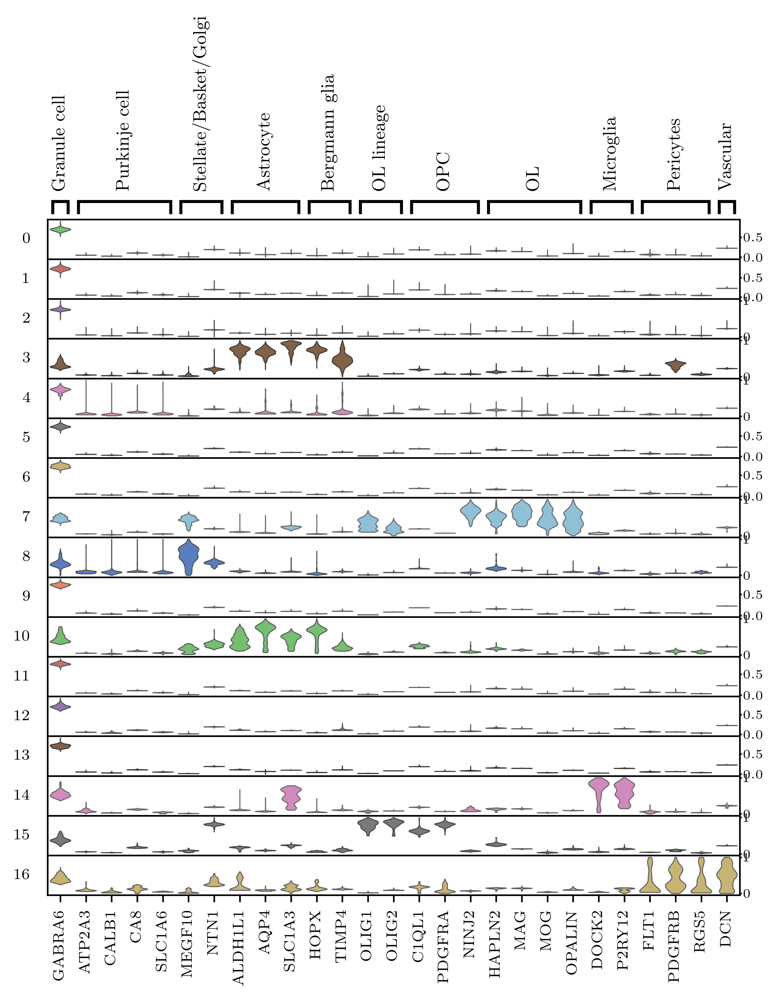

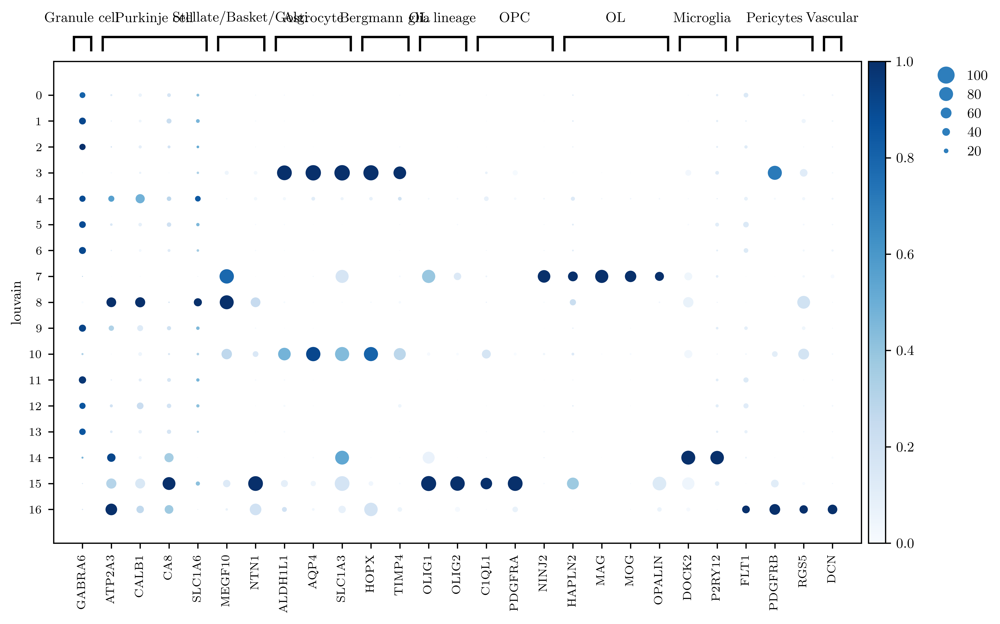

In [195]:
if True :
    if True :
        sctdata.layers['imputed_sct']=magic.MAGIC().fit_transform(sctdata.X)
    # need to get human markers 
    cluster = 'louvain'
    sc.pl.stacked_violin(sctdata,humanmarkers_sct,
                         layer='imputed_sct',
                         use_raw=False,
                         groupby=cluster,
                         standard_scale='var',
                         var_group_rotation=90,
                         save = '_humansct_imp.pdf')
    sc.pl.dotplot(sctdata,humanmarkers_sct,
                  use_raw=False,
                  groupby=cluster,
                  standard_scale='var',
                  var_group_rotation=0.0,
                  color_map='Blues',
                  save = '_humansct_noimp.pdf')

In [196]:
# dge 
def mwu(X,Y,gene_names,correction=None,debug=False) :
    '''
    Benjamini-Hochberg correction implemented. Can change to Bonferonni

    gene_names (list)
    if X,Y single gene expression array, input x.reshape(-1,1), y.reshape(-1,1)

    NOTE: get zeros sometimes because difference (p-value is so small)
    '''
    p=pd.DataFrame()
    print('... Mann-Whitney U w/Benjamini/Hochberg correction\n')
    start = time.time()
    for i,g in enumerate(gene_names) :
        if i==np.round(np.quantile(np.arange(len(gene_names)),0.25)) :
            print('... 25% completed in {:.2f}-s'.format(time.time()-start))
        elif i==np.round(np.quantile(np.arange(len(gene_names)),0.5)) :
            print('... 50% completed in {:.2f}-s'.format(time.time()-start))
        elif i==np.round(np.quantile(np.arange(len(gene_names)),0.75)) :
            print('... 75% completed in {:.2f}-s'.format(time.time()-start))
        p.loc[i,'Gene']=g
        if (tiecorrect(rankdata(np.concatenate((np.asarray(X[:,i]),np.asarray(Y[:,i])))))==0) :
            if debug :
                print('P-value not calculable for {}'.format(g))
            p.loc[i,'pval']=np.nan
        else :
            _,p.loc[i,'pval']=mannwhitneyu(X[:,i],Y[:,i]) # continuity correction is True
    print('... mwu computed in {:.2f}-s\n'.format(time.time() - start))
    # ignore NaNs, since can't do a comparison on these (change numbers for correction)
    p_corrected = p.loc[p['pval'].notna(),:]
    new_pvals = multipletests(p_corrected['pval'],method='fdr_bh')
    p_corrected['pval_corrected'] = new_pvals[1]
    return p_corrected

# up down dichotomy
adata.obs['genotype']=['SCA1' if 'SCA' in i else 'WT' for i in adata.obs['Sample']]
cluster = 'louvain'
print('\n----')
print('WT up...')
print('----\n')
total = time.time()
dge = pd.DataFrame()
for i in ['7']:#adata.obs[cluster].unique() :
    start = time.time()
    print('\n{}, WT vs SCA1'.format(i))
    print('----')
    X = adata[(adata.obs[cluster]==i) & (adata.obs['genotype']=='WT') ,:].layers['imputed_sct']
    Y = adata[(adata.obs[cluster]==i) & (adata.obs['genotype']=='SCA1') ,:].layers['imputed_sct']
    dt = scprep.stats.differential_expression(X,Y,
                                               measure = 'emd',
                                               direction='up',
                                               gene_names=adata.var_names,
                                               n_jobs=-1)
    dt = pd.DataFrame({'Cell type':[i]*dt.shape[0],'Gene':dt.index,'EMD':dt['emd']})
    dt = dt.iloc[0:100,:]
    # mann-whitney u, corrected p-values
    p = mwu(X,Y,adata.var_names)
    dt = pd.merge(dt,p,how='left',on="Gene")
    dge = dge.append(dt, ignore_index=True)
    print(dt.iloc[0:10,:])
    print('... computed in {:.2f}-s'.format(time.time()-start))
dge.to_csv(os.path.join(pfp,'humanimp_louvainDGE_WTup_sct7.csv'),index=False)
print('---- WT up in {:.2f}-min'.format((time.time() - total)/60))


# print('\n----')
# print('WT down...')
# print('----\n')
# dge = pd.DataFrame()
# total=time.time()
# for i in ['9','13','14','15','17','18']:#adata.obs[cluster].unique() :
#     start = time.time()
#     print('\n{}, WT vs SCA1'.format(i))
#     print('----')
#     X = adata[(adata.obs[cluster]==i) & (adata.obs['genotype']=='WT') ,:].layers['imputed_bbknn']
#     Y = adata[(adata.obs[cluster]==i) & (adata.obs['genotype']=='SCA1') ,:].layers['imputed_bbknn']
#     dt = scprep.stats.differential_expression(X,Y,
#                                                measure = 'emd',
#                                                direction='down',
#                                                gene_names=adata.var_names,
#                                                n_jobs=-1)
#     dt = pd.DataFrame({'Gene':dt.index,'EMD':dt['emd'],'Cell type':[i]*dt.shape[0]})
#     dt = dt.iloc[0:100,:]
#     # mann-whitney u, corrected p-values
#     p = mwu(X,Y,adata.var_names)
#     dt = pd.merge(dt,p,how='left',on="Gene")
#     dge = dge.append(dt, ignore_index=True)
#     print(dt.iloc[0:10,:])
#     print('... computed in {:.2f}-s'.format(time.time()-start))
# dge.to_csv(os.path.join(pfp,'humanimp_louvainDGE_WTdown.csv'),index=False)
# print('---- WT down in {:.2f}-min'.format((time.time() - total)/60))



In [198]:
adata = sctdata
# up down dichotomy
adata.obs['genotype']=['SCA1' if 'SCA' in i else 'WT' for i in adata.obs['Sample']]
cluster = 'louvain'
print('\n----')
print('WT up...')
print('----\n')
total = time.time()
dge = pd.DataFrame()
for i in ['7']:#adata.obs[cluster].unique() :
    start = time.time()
    print('\n{}, WT vs SCA1'.format(i))
    print('----')
    X = adata[(adata.obs[cluster]==i) & (adata.obs['genotype']=='WT') ,:].layers['imputed_sct']
    Y = adata[(adata.obs[cluster]==i) & (adata.obs['genotype']=='SCA1') ,:].layers['imputed_sct']
    dt = scprep.stats.differential_expression(X,Y,
                                               measure = 'emd',
                                               direction='up',
                                               gene_names=adata.var_names,
                                               n_jobs=-1)
    dt = pd.DataFrame({'Cell type':[i]*dt.shape[0],'Gene':dt.index,'EMD':dt['emd']})
    dt = dt.iloc[0:100,:]
    # mann-whitney u, corrected p-values
    p = mwu(X,Y,adata.var_names)
    dt = pd.merge(dt,p,how='left',on="Gene")
    dge = dge.append(dt, ignore_index=True)
    print(dt.iloc[0:10,:])
    print('... computed in {:.2f}-s'.format(time.time()-start))
dge.to_csv(os.path.join(pfp,'humanimp_louvainDGE_WTup_sct7.csv'),index=False)
print('---- WT up in {:.2f}-min'.format((time.time() - total)/60))


# print('\n----')
# print('WT down...')
# print('----\n')
# dge = pd.DataFrame()
# total=time.time()
# for i in ['9','13','14','15','17','18']:#adata.obs[cluster].unique() :
#     start = time.time()
#     print('\n{}, WT vs SCA1'.format(i))
#     print('----')
#     X = adata[(adata.obs[cluster]==i) & (adata.obs['genotype']=='WT') ,:].layers['imputed_bbknn']
#     Y = adata[(adata.obs[cluster]==i) & (adata.obs['genotype']=='SCA1') ,:].layers['imputed_bbknn']
#     dt = scprep.stats.differential_expression(X,Y,
#                                                measure = 'emd',
#                                                direction='down',
#                                                gene_names=adata.var_names,
#                                                n_jobs=-1)
#     dt = pd.DataFrame({'Gene':dt.index,'EMD':dt['emd'],'Cell type':[i]*dt.shape[0]})
#     dt = dt.iloc[0:100,:]
#     # mann-whitney u, corrected p-values
#     p = mwu(X,Y,adata.var_names)
#     dt = pd.merge(dt,p,how='left',on="Gene")
#     dge = dge.append(dt, ignore_index=True)
#     print(dt.iloc[0:10,:])
#     print('... computed in {:.2f}-s'.format(time.time()-start))
# dge.to_csv(os.path.join(pfp,'humanimp_louvainDGE_WTdown.csv'),index=False)
# print('---- WT down in {:.2f}-min'.format((time.time() - total)/60))


----
WT up...
----


7, WT vs SCA1
----
... Mann-Whitney U w/Benjamini/Hochberg correction

... 25% completed in 13.17-s
... 50% completed in 28.56-s
... 75% completed in 45.71-s
... mwu computed in 65.41-s

  Cell type        Gene       EMD          pval  pval_corrected
0         7       PWRN1  0.569175  1.522393e-05    2.746821e-05
1         7       PRR5L  0.428771  1.406612e-01    1.584964e-01
2         7     RAPGEF5  0.406553  1.579840e-01    1.764171e-01
3         7      GALNT6  0.403261  1.197121e-02    1.574557e-02
4         7        MUSK  0.380717  2.219289e-32    4.941008e-31
5         7       NEAT1  0.369096  2.946551e-04    4.676539e-04
6         7  AC092803.2  0.348781  1.582002e-02    2.046472e-02
7         7      MBOAT1  0.342934  9.752794e-03    1.297718e-02
8         7      MVB12B  0.334409  1.103331e-17    5.963173e-17
9         7   LMCD1-AS1  0.323166  1.195331e-11    3.800382e-11
... computed in 79.45-s
---- WT up in 1.32-min


In [175]:
test = pd.read_csv(os.path.join(pdfp,'test.csv'))

In [180]:
test.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
rn,AL627309.1,AL669831.5,LINC00115,NOC2L,KLHL17,HES4,ISG15,AGRN,C1orf159,SDF4,B3GALT6,UBE2J2,LINC01786,SCNN1D,ACAP3,PUSL1,INTS11,CPTP,DVL1
AAACCCAAGCAGGGAG-1-1-Jan,-0.142352,-0.420537,-0.116255,-0.374086,-0.158061,-0.0292919,-0.0472988,-0.0572151,-0.314302,-0.383719,-0.0818816,-0.360379,-0.0694916,-0.094039,1.23221,-0.0641049,-0.455842,-0.12532,-0.195059
AAACCCAAGCGAGTCA-1-1-Jan,-0.0953906,-0.296023,-0.0772764,-0.263938,-0.107572,-0.0135009,-0.0287883,-0.0358881,-0.218383,-0.267532,-0.0554313,-0.251913,-0.0448635,-0.063998,-0.356804,-0.0418651,-0.318591,-0.084143,-0.132841
AAACCCAAGCGATGCA-1-1-Jan,-0.183406,-0.524385,-0.150761,-0.46668,4.07883,-0.0435466,-0.0640003,-0.0764561,-0.395653,-0.481055,-0.105701,-0.45165,-0.0916933,-0.120996,-0.62325,-0.0841671,-0.569491,-0.16165,-0.248387
AAACCCAAGTGCCCGT-1-1-Jan,-0.129401,-0.386818,-0.105453,-0.344166,-0.144167,-0.0248883,-0.0421368,-0.0512661,-0.288157,2.16226,-0.0745046,-0.330904,-0.0626213,-0.08567,-0.463563,-0.0579009,-0.418775,-0.113925,-0.178026
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGCAATCTGCA-1-409,0.0520641,-0.137645,0.0349561,-0.222605,-0.11177,-0.0414554,0.178504,-0.0543793,-0.108158,0.282688,-0.107333,-0.0262449,0.00918693,-0.147251,-0.333251,-0.0664768,-0.281767,-0.0576508,0.0362087
TTTGGAGGTATGCAAA-1-409,-0.103156,-0.365288,0.202524,-0.0319557,-0.0118781,0.0203271,0.168092,-0.056362,-0.43433,-0.118395,0.0929329,-0.146633,-0.129655,-0.176137,-0.00294168,-0.263285,0.266298,-0.375908,-0.0675245
TTTGGAGGTGCCTGAC-1-409,0.374949,-0.24019,-0.0655796,-0.160439,-0.207029,-0.193338,-0.0117523,-0.061447,0.0121798,0.00977248,-0.034786,0.658476,-0.105141,2.11352,0.43988,-0.0608696,-0.412771,0.0873289,-0.179035
TTTGGTTTCGTAACAC-1-409,0.132349,-0.270996,-0.0952387,0.162215,8.27621,-0.0182492,-0.0404272,-0.0813683,0.32344,-0.0974875,-0.0044904,0.357624,0.110367,0.357313,-0.250001,0.0188511,-0.384577,-0.0876844,0.0203365


In [184]:
test.index = test['rn']
test = test.drop(columns='rn')

In [186]:
test.T

rn,AL627309.1,AL669831.5,LINC00115,NOC2L,KLHL17,HES4,ISG15,AGRN,C1orf159,SDF4,B3GALT6,UBE2J2,LINC01786,SCNN1D,ACAP3,PUSL1,INTS11,CPTP,DVL1
AAACCCAAGCAGGGAG-1-1-Jan,-0.142352,-0.420537,-0.116255,-0.374086,-0.158061,-0.029292,-0.047299,-0.057215,-0.314302,-0.383719,-0.081882,-0.360379,-0.069492,-0.094039,1.232209,-0.064105,-0.455842,-0.125320,-0.195059
AAACCCAAGCGAGTCA-1-1-Jan,-0.095391,-0.296023,-0.077276,-0.263938,-0.107572,-0.013501,-0.028788,-0.035888,-0.218383,-0.267532,-0.055431,-0.251913,-0.044863,-0.063998,-0.356804,-0.041865,-0.318591,-0.084143,-0.132841
AAACCCAAGCGATGCA-1-1-Jan,-0.183406,-0.524385,-0.150761,-0.466680,4.078826,-0.043547,-0.064000,-0.076456,-0.395653,-0.481055,-0.105701,-0.451650,-0.091693,-0.120996,-0.623250,-0.084167,-0.569491,-0.161650,-0.248387
AAACCCAAGTGCCCGT-1-1-Jan,-0.129401,-0.386818,-0.105453,-0.344166,-0.144167,-0.024888,-0.042137,-0.051266,-0.288157,2.162260,-0.074505,-0.330904,-0.062621,-0.085670,-0.463563,-0.057901,-0.418775,-0.113925,-0.178026
AAACCCACAAACCGGA-1-1-Jan,-0.180262,-0.516595,-0.148105,-0.459710,-0.198591,-0.042438,-0.062702,-0.074961,3.963833,-0.473739,-0.103853,-0.444777,-0.089969,-0.118908,-0.614280,-0.082608,0.875351,-0.158857,-0.244340
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGCAATCTGCA-1-409,0.052064,-0.137645,0.034956,-0.222605,-0.111770,-0.041455,0.178504,-0.054379,-0.108158,0.282688,-0.107333,-0.026245,0.009187,-0.147251,-0.333251,-0.066477,-0.281767,-0.057651,0.036209
TTTGGAGGTATGCAAA-1-409,-0.103156,-0.365288,0.202524,-0.031956,-0.011878,0.020327,0.168092,-0.056362,-0.434330,-0.118395,0.092933,-0.146633,-0.129655,-0.176137,-0.002942,-0.263285,0.266298,-0.375908,-0.067525
TTTGGAGGTGCCTGAC-1-409,0.374949,-0.240190,-0.065580,-0.160439,-0.207029,-0.193338,-0.011752,-0.061447,0.012180,0.009772,-0.034786,0.658476,-0.105141,2.113518,0.439880,-0.060870,-0.412771,0.087329,-0.179035
TTTGGTTTCGTAACAC-1-409,0.132349,-0.270996,-0.095239,0.162215,8.276210,-0.018249,-0.040427,-0.081368,0.323440,-0.097488,-0.004490,0.357624,0.110367,0.357313,-0.250001,0.018851,-0.384577,-0.087684,0.020337
